In [1]:
%matplotlib inline
import platform
print(platform.python_version())
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from numpy import asarray
from matplotlib import gridspec
from scipy import stats
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogFormatterMathtext
import root_numpy
import json
from numpy import asarray
from root_pandas import read_root
from scipy.interpolate import interp1d
from scipy.integrate import quad
from textwrap import wrap
import copy

import seaborn as sns
# import SupportingFunctions as SF

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import ROOT

3.5.2
Welcome to JupyROOT 6.14/08


In [2]:
def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = df['xsec_corr_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1 # davios functions for plotting...
    return wgt
  
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.interpolate import interp1d
from scipy.integrate import quad
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from textwrap import wrap
import copy

def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = df['xsec_corr_weight'].values
    wgt[wgt <= 0] = 1
    wgt[wgt >= 2] = 1
    if 'new_weight' in df.columns:
        tmpweights = df['new_weight'].values
    else:
        tmpweights = []
        for i in range(len(wgt)):
            tmpweights.append(1.0)
            
    for i in range(len(wgt)):
        wgt[i] = wgt[i]*tmpweights[i]
    
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt


class sampHist:

    def __init__(self,samp_df,samp_l,samp_c,samp_wind,samp_s):
        self._df = samp_df.copy()
        self._label = samp_l
        self._color = samp_c
        self._scale = samp_s
        self._wi = samp_wind
        if samp_wind == 0:
            self._wgt = np.ones(len(samp_df))
        if samp_wind == 1:
            self._wgt = CV(samp_df)

    def setweight(self,windex):
        if windex == 0:
            self._wgt = np.ones(len(self._df))
        if windex == 1:
            self._wgt = CV(self._df)

    def dist(self,s_var):
        return self._df[s_var].values

    def cosdist(self,s_var):
        return np.cos(self._df[s_var].values)

    def applycut(self,s_cut):
        newhist = copy.deepcopy(self)
        newhist._df = self._df.query(s_cut)
        newhist.setweight(self._wi)
        return newhist

class SimpleHisto:

    def __init__ (self,df_df,f_scale,i_wgt,s_color,s_label):
        temp_df = df_df.copy()
        temp_df['myscale'] = f_scale
        self.mydf = temp_df
        self.mycolor = s_color
        self.mylabel = s_label
        self.iwgt = i_wgt

        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def GetHist(self,s_varname):
        temp_df = self.mydf.query(self.mycut)
        if self.iwgt == 1:
            myweight = CV(temp_df)
        elif self.iwgt == 0:
            myweight = np.ones(len(temp_df))
        return temp_df[s_varname].values,myweight,temp_df['myscale'].values,self.mycolor,self.mylabel

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

class StackedHisto:

    def  __init__ (self,a_df_mc,a_df_scale):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layeriwgt = []
        self.stratxweight = []

        temp_a_df = []
        for i in range(len(a_df_mc)):
            temp_df = a_df_mc[i].copy()
            temp_df['myscale'] = a_df_scale[i]
            temp_a_df.append(temp_df)
        self.mymc = pd.concat(temp_a_df)
        self.mycut ='_pi0mass >0'


    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def AddLayer(self,df_layer,df_scale,i_wgt,s_label,s_color):
        temp_df = df_layer.copy()
        temp_df['myscale'] = df_scale
        self.mylayer.append(temp_df)
        self.layerlabel.append(s_label)
        self.layercolor.append(s_color)
        self.layeriwgt.append(i_wgt)

    def AddStrata(self,s_strata,s_label,s_color,f_wgt=1.0):
        self.mystrata.append(s_strata)
        self.stratalabel.append(s_label)
        self.stratacolor.append(s_color)
        self.stratxweight.append(f_wgt)

    def GetHists(self,s_varname):
        a_vals = []        # (nxN)
        a_wgts = []
        a_scale = []
        a_cols = []        # (nx1)
        a_labels = []

        # first, run  through strata
        for i in range(len(self.mystrata)):
            # isolate this stratum with current cut
            temp_df = self.mymc.query(self.mystrata[i]+' and '+self.mycut)

            a_vals.append(temp_df[s_varname].values)
            a_wgts.append(CV(temp_df) * self.stratxweight[i])   # ah, this is if we want to scale an individual stratum
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.stratacolor[i])
            a_labels.append(self.stratalabel[i])

        for i in range(len(self.mylayer)):
            temp_df = self.mylayer[i].query(self.mycut)

            a_vals.append(temp_df[s_varname].values)
            if self.layeriwgt[i] == 1:
                a_wgts.append(CV(temp_df))
            elif self.layeriwgt[i] == 0:
                a_wgts.append(np.ones(len(temp_df)))
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.layercolor[i])
            a_labels.append(self.layerlabel[i])

        return  np.asarray(a_vals),np.asarray(a_wgts),np.asarray(a_scale),a_cols,a_labels

    def ClearLayers(self):
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layerwgt = []

    def ClearStrata(self):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []


class distVar:

    def __init__(self,s_name,n_range,s_label='',s_cov=''):
        self.myname = s_name
        self.myrange = n_range
        self.myscov = s_cov
        if s_label == '':
            self.mylabel = s_name
        else:
            self.mylabel = s_label
            
def PmuGivenX(mu,x):

    # Returns the probability density value that the true mean is mu given that you
    # have observed x events. Actually employs a series approximation because the real formula
    # involves a very very large numerator and denominator and overflows even high precision
    # variables if your bins contain more than a few hundred events
    # Approximation is good to O(0.1%) or better at all values

    pi  = np.pi
    c   = [1.,-1./12,1./288,139./51840,-571./2488320,-163879./209018880]

    if x == 0:
        return np.exp(-mu)
    else:
        poly = sum(c[i]/x**(i+0.5) for i in range(len(c)))
        return 1/np.sqrt(2*pi)*np.exp(x+x*np.log(mu/x)-mu)*poly


def distplot_wratio_davio(myvar,nbins,myrange,stackedhists,datahist,stxcoord,m_cov,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])


    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
            else:
                m_cov[i][j] = 0

    # Normalization uncertainty:
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)
    print('Normalization Uncertainty:',np.sqrt(fNorm_squared))

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

    yerr_data = np.sqrt(yerrsq_data)

    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)

    # calc chi2
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print(chisq/float(ndof),pval)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, .75])
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=20)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=16)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
    ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='MC Sys+Stat Error')
    ax0.legend(loc='upper right',fontsize=15,frameon=False,ncol=2)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)

    #ax1.legend(loc='lower right',fontsize=15,frameon=False)

    ax1.axhline(1,color='black',linestyle=':')
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    ax1.annotate('p-value: %.3f\n'%pval+r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof)),xy=(.85,.7), xycoords='axes fraction',fontsize=15,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()

    return fig,ax0,ax1,pval
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt

def distplot(nbins,myrange,_hists,data,data_weight,stxcoord,ymax):

    fig.patch.set_alpha(1)
    vals_mc = np.zeros(nbins)

    for i in xrange(0,len(_hists)):
        v1,binedges = np.histogram(_hists[i],nbins,range=myrange,weights=a_weights[i])
        vals_mc += v1

    vals_data,_ = np.histogram(var_data,nbins,range=myrange,weights=data_weight)

    bincenters = np.diff(binedges)/2 + binedges[:-1]     
    
    plt.ylim(0,ymax)
    plt.xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Events in 7e20 POT',fontsize=20)
    ax.set_title('MCC9 Data/MC',fontsize=30)

    plt.hist(_hists,nbins,range=myrange,weights=a_weights,color=a_colors,stacked=True,linewidth=2.5,label=a_labels,edgecolor='None')
    ax.errorbar(bincenters,vals_data,fmt='.',yerr=np.sqrt(vals_data/DATA_POT*POT_SCALE_FACTOR),color='black',capsize=5,label='bnb5e19')

    ax.legend(loc='upper right',fontsize=15,frameon=False,ncol=3)
    
    print ('Events:',vals_data.sum())
    print ('MC: ',vals_mc.sum())
    
def distplot_normed(nbins,myrange,_hists,data,data_weight,stxcoord,ymax):

    fig.patch.set_alpha(1)
    vals_mc = np.zeros(nbins)


    for i in xrange(0,len(_hists)):
        v1,binedges = np.histogram(_hists[i],nbins,range=myrange,weights=a_weights[i])
        vals_mc += v1
    
    vals_data,_ = np.histogram(var_data,nbins,range=myrange,weights=data_weight,density=1)

    bincenters = np.diff(binedges)/2 + binedges[:-1]     
    
    plt.ylim(0,ymax)
    plt.xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Area Normalized',fontsize=20)
    ax.set_title('MCC9 Data/MC [AREA NORMED]',fontsize=30)

    plt.hist(_hists,nbins,range=myrange,weights=a_weights,color=a_colors,stacked=True,linewidth=2.5,label=a_labels,density=1,edgecolor='None')
    ax.errorbar(bincenters,vals_data,fmt='.',yerr=np.sqrt(vals_data/DATA_POT*POT_SCALE_FACTOR),color='black',capsize=5,label='bnb5e19')
    
    ax.legend(loc='upper right',fontsize=15,frameon=False)
    print ('Events:',vals_data.sum())
    
def distplot_wratio(nbins,myrange,_hists,data,data_weight,stxcoord,ymax,writepval=True):

    fig.patch.set_alpha(1)
    vals_mc = np.zeros(nbins)
    yerr_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    
    a_labels_evts = []
    
    print(len(_hists),len(a_weights))
    
    for i in range(0,len(_hists)):
        print(i,len(_hists[i]),len(a_weights[i]))
        v1,binedges = np.histogram(_hists[i],nbins,range=myrange,weights=a_weights[i])
        yerr_mc += v1*a_scale[i]
        vals_mc += v1
        v1_raw,binedges_raw = np.histogram(_hists[i],nbins,range=myrange)
        vals_mc_raw+=v1_raw
        a_labels_evts.append(a_labels[i]+' (%.2f)'%v1.sum())
    
    yerr_mc = np.sqrt(yerr_mc)
    
#     vals_data_err,_err= np.histogram(data,nbins,range=myrange) 
    vals_data,_ = np.histogram(data,nbins,range=myrange,weights=data_weight)
    vals_data_err = vals_data*DATA_SCALE_TOTAL
    bincenters = np.diff(binedges)/2 + binedges[:-1]     
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=20)
    ax0.set_ylabel('Events',fontsize=20)
    ax1.set_ylabel('Data/MC',fontsize=20)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(_hists,nbins,range=myrange,weights=a_weights,color=a_colors,stacked=True,linewidth=0,label=a_labels_evts,edgecolor=None)
    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=np.sqrt(vals_data/DATA_POT_TOTAL*POT_SCALE_FACTOR),color='black',capsize=5,label='data(run1+run3) (%i)'%vals_data.sum())
    
    ax0.legend(loc='upper right',fontsize=15,frameon=False,ncol=2)
    
    er_rat = np.sqrt(np.power(np.divide(yerr_mc,vals_mc),2) + np.power(np.divide(np.sqrt(vals_data_err),vals_data),2)) * np.true_divide(vals_data,vals_mc)
    
    chisq = 0.0
    m_cov = np.zeros((nbins,nbins)) 
    ndof = 0
    normshift =1
    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
#                 print(yerrsq_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i]
        else:
            m_cov[i][i] += 999

    yerr_data = np.sqrt(yerrsq_data)
    
#     print(yerr_data)
#     print(m_cov)

    invcov = np.linalg.inv(m_cov)
#     print(invcov)
#     invcov= m_cov
    # calc chi2
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
#                 print((vals_mc[i]*normshift - vals_data[i]) * (vals_mc[j]*normshift - vals_data[j]) * invcov[i][j])
                chisq += (vals_mc[i]*normshift - vals_data[i]) * (vals_mc[j]*normshift - vals_data[j]) * invcov[i][j]
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print ("stats:",chisq,pval)
    
    
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=er_rat,fmt='o',color='maroon',capsize=0)
    ax1.axhline(1,color='maroon',linestyle=':')
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f'%(vals_data.sum()/float(vals_mc.sum())),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))
    
    ax1.annotate('p-value: %.3f\n'%pval+r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof)),xy=(.85,.7), xycoords='axes fraction',fontsize=15,bbox=dict(boxstyle="round4", fc="w",alpha=.9))
    
    plt.tight_layout()
    print ('Events:',vals_data.sum())
    print ('MC: ',vals_mc.sum())
    print(ndof,sqrt(2*ndof))
    return ax0,chisq/float(ndof)



In [3]:
NUMU_R1_POT = 4.71579e+20
NUE_R1_POT  = 9.80259e+22

NUMU_R3_POT = 8.98773223801e+20
NUE_R3_POT = 4.707047e+22

NUMU_R2_POT = 4.08963968669e+20
NUE_R2_POT = 9.2085012316e+22

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18
DATA_R1_PI0FILTER_POT =1.746e+20
DATA_R2D_PI0FILTER_POT = 2.050e+20
DATA_R2E_PI0FILTER_POT = 6.507e+19
DATA_R3F_PI0FILTER_POT = 4.3e+19
DATA_R3G_PI0FILTER_POT = 2e+20

FAKE_DATA_1_RUN1_POT = 1.925e20
FAKE_DATA_1_RUN3_POT = 2.83e20

EXT_R1_PI0FILTER_POT = 22474918.0/41898673.0 * DATA_R1_PI0FILTER_POT 
EXT_R1_OPEN_POT = 22474918.0 / 9776965.0* DATA_R1_OPEN_POT
EXT_R1_FAKE1_POT = 22474918.0 /41898673.0* FAKE_DATA_1_RUN1_POT

EXT_R2D_PI0FILTER_POT =  39566274.0/49422124.0 * DATA_R2D_PI0FILTER_POT
EXT_R2E_PI0FILTER_POT =  39566274.0/19914275.0 * DATA_R2E_PI0FILTER_POT
EXT_R3F_PI0FILTER_POT =  39566274.0/11229268.0 * DATA_R3F_PI0FILTER_POT
EXT_R3G_PI0FILTER_POT =  39566274.0/51705212.0 * DATA_R3G_PI0FILTER_POT
EXT_R3_OPEN_POT = 39566274.0/2263559.0 * DATA_R3_OPEN_POT
EXT_R3_FAKE1_POT = 39566274.0/11229268.0 * FAKE_DATA_1_RUN3_POT

POT_SCALE_FACTOR = 1.0 #if I feel like playing with scaling
# CURRENT TOTAL
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT
print("total POT: ",DATA_POT_TOTAL)


total POT:  6.8767e+20


In [4]:
NUMU_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_POT)
NUE_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUE_R1_POT)
EXT_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(EXT_R1_PI0FILTER_POT)

NUMU_R2D_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(EXT_R2D_PI0FILTER_POT)
NUMU_R2E_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(EXT_R2E_PI0FILTER_POT)

NUMU_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(EXT_R3F_PI0FILTER_POT)
NUMU_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(EXT_R3G_PI0FILTER_POT)

In [5]:
# Or, we can load from pickles if you, you know, want to.
# Pickle read for easy access later, eh?
tag = 'Aug_10_run1'
df_numu_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
df_nue_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'July_28_run1_new'
df_ext_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag ='Aug_21_run2'
df_numu_r2_goodruns_pmtprecut =pd.read_pickle('../../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag ='Sept_9_run2_MC'
df_nue_r2_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)

tag = 'Aug_10_run3'
df_numu_r3_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)

tag = 'July_28_run3'
df_nue_r3_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
df_ext_r3_goodruns_pmtprecut = pd.read_pickle('../../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag = 'Aug_20_pi0box_run1'
df_data_r1_pi0filter_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Aug_20_pi0box_run2D'
df_data_r2D_pi0filter_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Aug_20_pi0box_run2E'
df_data_r2E_pi0filter_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Aug_20_pi0box_run3F'
df_data_r3F_pi0filter_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Aug_20_pi0box_run3G'
df_data_r3G_pi0filter_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

tag = 'July_30_open_run3'
df_data_r3_open_pmtprecut = pd.read_pickle('../../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

In [6]:
# make pi0 cut and set weights and combine to total data frames
cuts = '_pi0mass<400 and  PassShowerReco==1 and PassPMTPrecut==1 and DeltaMass >0 and DeltaMass <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass>0 and BDTscore_1e1p<.7'
df_numu_pi0 = df_numu_goodruns_pmtprecut.query(cuts)
df_nue_pi0 = df_nue_goodruns_pmtprecut.query(cuts)
df_ext_pi0 = df_ext_goodruns_pmtprecut.query(cuts)
df_numu_r2_pi0 = df_numu_r2_goodruns_pmtprecut.query(cuts)
df_nue_r2_pi0 = df_nue_r2_goodruns_pmtprecut.query(cuts)
df_numu_r3_pi0 = df_numu_r3_goodruns_pmtprecut.query(cuts)
df_nue_r3_pi0 = df_nue_r3_goodruns_pmtprecut.query(cuts)
df_ext_r3_pi0 = df_ext_r3_goodruns_pmtprecut.query(cuts)
# print(len(df_numu_pi0["pi0_energy_true"].values))
print(len(df_numu_r2_pi0["pi0_energy_true"].values))
print(len(df_numu_r3_pi0["pi0_energy_true"].values))
print(len(df_nue_pi0["pi0_energy_true"].values))
print(len(df_nue_r2_pi0["pi0_energy_true"].values))
print(len(df_nue_r3_pi0["pi0_energy_true"].values))
df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pmtprecut.query(cuts)
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pmtprecut.query(cuts)
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pmtprecut.query(cuts)
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pmtprecut.query(cuts)
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pmtprecut.query(cuts)

# combine to make total dataframes
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r2D_pi0filter_pi0)
df_data_total_2 = df_data_total_1.append(df_data_r2E_pi0filter_pi0)
df_data_total_3 = df_data_total_2.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_3.append(df_data_r3G_pi0filter_pi0)
print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))

# general mc 
df_numu_total_1 = df_numu_pi0.append(df_numu_r2_pi0)
df_numu_total = df_numu_total_1.append(df_numu_r3_pi0)
df_nue_total_1 = df_nue_pi0.append(df_nue_r2_pi0)
df_nue_total = df_nue_total_1.append(df_nue_r3_pi0)

df_ext_total = df_ext_pi0.append(df_ext_r3_pi0)

NUMU_POT_TOTAL = NUMU_R1_POT+NUMU_R2_POT+NUMU_R3_POT
NUE_POT_TOTAL = NUE_R1_POT+NUE_R2_POT+NUE_R3_POT
EXT_POT_TOTAL = EXT_R1_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT

# DATA_POT_TOTAL = FAKE_DATA_1_RUN1_POT + FAKE_DATA_1_RUN3_POT
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+ DATA_R3G_PI0FILTER_POT
print("pot total:",DATA_POT_TOTAL)
POT_SCALE_FACTOR = DATA_POT_TOTAL
NUMU_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUMU_POT_TOTAL)
NUE_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUE_POT_TOTAL)
EXT_SCALE_TOTAL = POT_SCALE_FACTOR / float(EXT_POT_TOTAL)
DATA_SCALE_TOTAL = POT_SCALE_FACTOR / float(DATA_POT_TOTAL)

# normalization of mc/data
norm = (len(df_data_total)*DATA_SCALE_TOTAL)/(len(df_numu_total)*NUMU_SCALE_TOTAL + len(df_ext_total)*EXT_SCALE_TOTAL + len(df_nue_total)*NUE_SCALE_TOTAL)
print(norm)

2210
2221
1423
2455
885
total number of data pi0:  1707
pot total: 4.176e+20
1.1712646388204715


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [7]:
#seperate out truth types
df_pi0_test = df_numu_total.query('haspi0==1')
df_energy_test = df_numu_total.query('pi0_energy_true>0')
print("test of length: pi0",len(df_pi0_test),"has energy", len(df_energy_test))

df_bnb_ncpi0 = df_numu_total.query('pi0_energy_true>0 and ccnc==1 and MC_scedr<5')
df_bnb_ccpi0 = df_numu_total.query("pi0_energy_true>0 and ccnc!=1 and MC_scedr<5") 
df_bnb_pi0_offvtx = df_numu_total.query("pi0_energy_true>0 and MC_scedr>=5 ") 
df_bnb_other_offvtx = df_numu_total.query("pi0_energy_true<=0 and MC_scedr>=5 ")
df_bnb_other_good = df_numu_total.query("pi0_energy_true<=0 and MC_scedr<5")

weights_bnb_ncpi0 = CV(df_bnb_ncpi0)*NUMU_SCALE_TOTAL*norm
weights_bnb_ccpi0 = CV(df_bnb_ccpi0)*NUMU_SCALE_TOTAL*norm
weights_bnb_pi0_offvtx = CV(df_bnb_pi0_offvtx)*NUMU_SCALE_TOTAL*norm
weights_bnb_other_offvtx = CV(df_bnb_other_offvtx)*NUMU_SCALE_TOTAL*norm
weights_bnb_other_good = CV(df_bnb_other_good)*NUMU_SCALE_TOTAL*norm

weights_numu_pi0 = CV(df_numu_total)*NUMU_SCALE_TOTAL*norm
weights_nue_pi0 = CV(df_nue_total)*NUE_SCALE_TOTAL*norm
weights_ext_pi0 = np.ones(len(df_ext_total))*EXT_SCALE_TOTAL*norm
weights_data_pi0 = np.ones(len(df_data_total))*DATA_SCALE_TOTAL*norm

test of length: pi0 4795 has energy 4403


In [8]:
# make lists of categories
df_mc_all = [df_bnb_ncpi0, df_bnb_ccpi0, df_bnb_pi0_offvtx, df_bnb_other_offvtx, df_bnb_other_good, df_nue_total, df_ext_total]
# these are good pi0 events for my purposes
df_mc_good = [df_bnb_ncpi0, df_bnb_ccpi0,df_bnb_pi0_offvtx,]
df_mc_background = [df_bnb_other_offvtx, df_bnb_other_good, df_nue_total, df_ext_total]

a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]
a_scale = [NUMU_SCALE_TOTAL,NUMU_SCALE_TOTAL,NUMU_SCALE_TOTAL,NUMU_SCALE_TOTAL,NUMU_SCALE_TOTAL,NUE_SCALE_TOTAL,EXT_SCALE_TOTAL]
a_colors = ['cyan','greenyellow','darkgreen','gold','grey','pink','fuchsia']
a_labels = [r"NC $\pi^0$",r"CC $\pi^0$",r"OffVtx $\pi^0$",r"OffVtx non-$\pi^0$",r"good non-$\pi^0$",r'$\nu_e$ Intrinsic Overlay','EXTBNB']


3364 1039


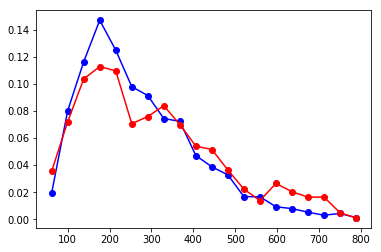

In [9]:
# Make some lists...
df_good_true = df_bnb_ncpi0.append(df_bnb_ccpi0)
Var_good_true = df_good_true['pi0_momentum_true'].values
Var_off_vtx_true = df_bnb_pi0_offvtx['pi0_momentum_true'].values
print(len(df_good_true),len(df_bnb_pi0_offvtx))

weights_good_true = CV(df_good_true)*(1.0/float(len(df_good_true)))
weights_offvtx_true = CV(df_bnb_pi0_offvtx)*(1.0/float(len(df_bnb_pi0_offvtx)))

# turn into histograms
Good_True_Hist,binedges = np.histogram( Var_good_true, bins = 20, range = [35,800],weights = weights_good_true)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)

Offvtx_True_Hist,_ = np.histogram( Var_off_vtx_true, bins = 20, range = [35,800], weights = weights_offvtx_true )
                                             
plt.plot(bincenters,Good_True_Hist,color = 'blue', marker = 'o')
plt.plot(bincenters,Offvtx_True_Hist,color = 'red', marker = 'o')
plt.show()
plt.close()

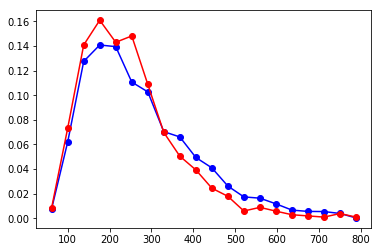

In [10]:
# Make some lists...

df_good_reco = df_bnb_ncpi0.append(df_bnb_ccpi0)
Var_good_reco = df_good_reco['Pi0Momentum_reco'].values
Var_off_vtx_reco = df_bnb_pi0_offvtx['Pi0Momentum_reco'].values

weights_good_reco = CV(df_good_reco)*(1.0/float(len(df_good_reco)))
weights_offvtx_reco = CV(df_bnb_pi0_offvtx)*(1.0/float(len(df_bnb_pi0_offvtx)))

# turn into histograms
Good_Reco_Hist,binedges = np.histogram( Var_good_reco, bins = 20, range = [35,800],weights = weights_good_reco)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)

Offvtx_Reco_Hist,_ = np.histogram( Var_off_vtx_reco, bins = 20, range = [35,800], weights = weights_offvtx_reco )
                                             
plt.plot(bincenters,Good_Reco_Hist,color = 'blue', marker = 'o')
plt.plot(bincenters,Offvtx_Reco_Hist,color = 'red', marker = 'o')
plt.show()
plt.close()

In [11]:
# make resolution plots
def pi0energyres(df):
    #calculates the pi0 energy resolution
    #(reco-true)/true
    var = []
    for x in range(len(df)):
        recoE = df['Pi0Energy_reco'].values[x]
        trueE = df['pi0_energy_true'].values[x]
        if trueE >0:
            var.append((recoE-trueE)/trueE)
        else:
            var.append(-9999)
    return var

def pi0momentumres(df):
    #calculates the pi0 momentum resolution
    #(reco-true)/true
    var = []
    for x in range(len(df)):
        recoP = df['Pi0Momentum_reco'].values[x]
        trueP = df['pi0_momentum_true'].values[x]
        if trueP >0:
            var.append((recoP-trueP)/trueP) 
        else:
            var.append(-9999)
    return var

[0.         0.00036443 0.00036443 0.00521334 0.01299057 0.02769825
 0.05070275 0.07546733 0.10910774 0.13503909 0.14952123 0.17594032
 0.12848067 0.06077205 0.0222198  0.01322507 0.00806887 0.00734917
 0.00414935 0.00645638] [-1.  -0.9 -0.8 -0.7 -0.6 -0.5 -0.4 -0.3 -0.2 -0.1  0.   0.1  0.2  0.3
  0.4  0.5  0.6  0.7  0.8  0.9  1. ]


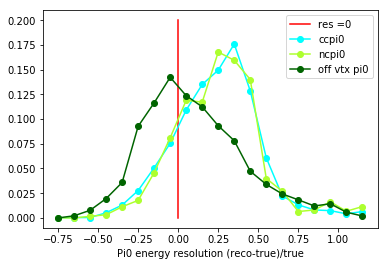

In [12]:
# Make resolution plots
Var_cc = pi0energyres(df_bnb_ccpi0)
Var_nc = pi0energyres(df_bnb_ncpi0)
Var_off_vtx_reco = pi0energyres(df_bnb_pi0_offvtx)

weights_cc = CV(df_bnb_ccpi0)*(1/len(df_bnb_ccpi0))
weights_nc = CV(df_bnb_ncpi0)*(1/len(df_bnb_ncpi0))
weights_offvtx = CV(df_bnb_pi0_offvtx)*(1/len(df_bnb_pi0_offvtx))

# turn into histograms
CC_Hist,binedges = np.histogram( Var_cc, bins = 20, range = [-1,1],weights = weights_cc)
print(CC_Hist,binedges)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(5.0/20.0)

NC_Hist,_ = np.histogram( Var_nc, bins = 20, range = [-1,1],weights = weights_nc)
Offvtx_Reco_Hist,_ = np.histogram( Var_off_vtx_reco, bins = 20, range = [-1,1], weights = weights_offvtx_reco)

X = [0,0,0,0,0,0,0,0,0,0,0]
Y = [0,.02,.04,.06,.08,.1,.12 ,.14,.16,.18,.2]
plt.plot(X,Y,color='red',label="res =0")
                                            
plt.plot(bincenters,CC_Hist,color = 'cyan', marker = 'o',label = "ccpi0")
plt.plot(bincenters,NC_Hist,color = 'greenyellow', marker = 'o', label = "ncpi0")
plt.plot(bincenters,Offvtx_Reco_Hist,color = 'darkgreen', marker = 'o',label = "off vtx pi0")
plt.xlabel("Pi0 energy resolution (reco-true)/true")
plt.legend()
plt.show()
plt.close()

[0.         0.00036443 0.00072886 0.00748474 0.0232354  0.03649777
 0.05574102 0.07835747 0.1033894  0.13134335 0.13607845 0.16369813
 0.11789496 0.05591461 0.03095038 0.01616426 0.00930277 0.00600324
 0.00637721 0.00327988] [-1.  -0.9 -0.8 -0.7 -0.6 -0.5 -0.4 -0.3 -0.2 -0.1  0.   0.1  0.2  0.3
  0.4  0.5  0.6  0.7  0.8  0.9  1. ]


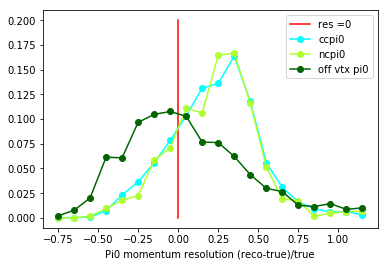

In [13]:
# Make resolution plots
Var_cc = pi0momentumres(df_bnb_ccpi0)
Var_nc = pi0momentumres(df_bnb_ncpi0)
Var_off_vtx_reco = pi0momentumres(df_bnb_pi0_offvtx)

# turn into histograms
CC_Hist,binedges = np.histogram( Var_cc, bins = 20, range = [-1,1],weights = weights_cc)
print(CC_Hist,binedges)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(5.0/20.0)

NC_Hist,_ = np.histogram( Var_nc, bins = 20, range = [-1,1],weights = weights_nc)
Offvtx_Reco_Hist,_ = np.histogram( Var_off_vtx_reco, bins = 20, range = [-1,1], weights = weights_offvtx_reco)

X = [0,0,0,0,0,0,0,0,0,0,0]
Y = [0,.02,.04,.06,.08,.1,.12 ,.14,.16,.18,.2]
plt.plot(X,Y,color='red',label="res =0")
                                            
plt.plot(bincenters,CC_Hist,color = 'cyan', marker = 'o',label = "ccpi0")
plt.plot(bincenters,NC_Hist,color = 'greenyellow', marker = 'o', label = "ncpi0")
plt.plot(bincenters,Offvtx_Reco_Hist,color = 'darkgreen', marker = 'o',label = "off vtx pi0")
plt.xlabel("Pi0 momentum resolution (reco-true)/true")
plt.legend()
plt.show()
plt.close()

checking lengths...
10552 10552
4403 4403
6149 6149
1707


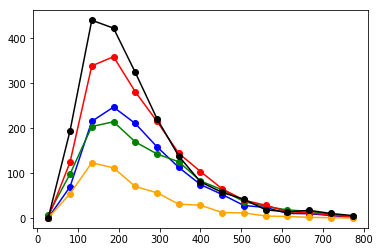

In [14]:
nbins = 15
myrange =[0,800]
# Make some lists...
Var_Selected_Events_Reco = [] #reco
Var_Selected_Events_True = [] #true
Var_Selected_Events_Weights = [] #true
Var_All_Selected_MCEvents = [] #reco
Var_Background_Count = [] #reco
Var_Data = []#reco

weights_all = []
weights_good = []
weights_background = []
for idx in range(len(a_weights)):
    weights_all.extend(a_weights[idx][:])
    if (idx == 0 or idx ==1 or idx==2):
        weights_good.extend(a_weights[idx])
    else:
        weights_background.extend(a_weights[idx])
        

# fill the lists -loop through data frames:
for idx in range(len(df_mc_all)):
    reco_momentum = df_mc_all[idx]['pi0_momentum_reco'].values
    Var_All_Selected_MCEvents.extend(reco_momentum)
    if (idx == 0 or idx ==1 or idx==2):
        true_momentum = df_mc_all[idx]['pi0_momentum_true'].values
        Var_Selected_Events_Reco.extend(reco_momentum)
        Var_Selected_Events_True.extend(true_momentum)
        Var_Selected_Events_Weights.extend(df_mc_all[idx]['xsec_corr_weight'].values)
    else:
        Var_Background_Count.extend(reco_momentum)

print("checking lengths...")
print(len(weights_all),len(Var_All_Selected_MCEvents) )
print(len(weights_good),len(Var_Selected_Events_Reco) )
print(len(weights_background),len(Var_Background_Count) )


Var_data = df_data_total['pi0_momentum_reco'].values
print(len(Var_data) )
    

# turn into histograms
Selected_Events_Reco_Hist,binedges = np.histogram( Var_Selected_Events_Reco, bins = nbins, range = myrange,weights= weights_good)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)

Selected_Events_True_Hist,_ = np.histogram( Var_Selected_Events_True, bins = nbins, range = myrange,weights= weights_good)
All_Selected_MCEvents_Hist,_ = np.histogram( Var_All_Selected_MCEvents, bins = nbins, range = myrange,weights= weights_all)
Background_Count_Hist,_ = np.histogram( Var_Background_Count,bins = nbins, range = myrange,weights= weights_background)
Data_Hist,_ = np.histogram( Var_data,bins = nbins, range = myrange,weights= weights_data_pi0)

plt.plot(bincenters,Selected_Events_Reco_Hist,color = 'blue', marker = 'o')
plt.plot(bincenters,Selected_Events_True_Hist,color = 'green', marker = 'o')
plt.plot(bincenters,All_Selected_MCEvents_Hist,color = 'red', marker = 'o')
plt.plot(bincenters,Background_Count_Hist,color = 'orange', marker = 'o')
plt.plot(bincenters,Data_Hist,color = 'black', marker = 'o')
plt.show()
plt.close()

In [15]:
# Create Response Matrix
Response_Matrix = ROOT.RooUnfoldResponse(nbins, 0.0, 800.0)


# Loop through selected events
for val in range(len(Var_Selected_Events_True)):
#     print(Var_Selected_Events_Reco[val],Var_Selected_Events_True[val],Var_Selected_Events_Weights[val])
    Response_Matrix.Fill(Var_Selected_Events_Reco[val],Var_Selected_Events_True[val],Var_Selected_Events_Weights[val])
    
# c1 = ROOT.TCanvas("canoe","canoe",1000,1000)
# Response_Matrix.Draw("")
# c1.SaveAs("ResponseMatrix.pdf")

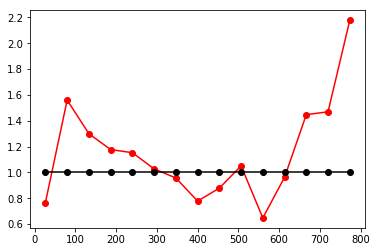

In [16]:
# make ratio histogram
Data_MC_Ratio = np.divide(Data_Hist, All_Selected_MCEvents_Hist)
# put a line at R=1
testline = np.ones(len(bincenters))
plt.plot(bincenters,Data_MC_Ratio,color = 'Red', marker = 'o')
plt.plot(bincenters,testline,color = 'Black', marker = 'o')

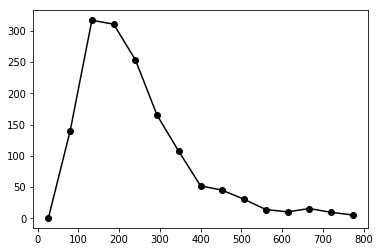

In [17]:
# First subtract backgrounds
Data_Minus_Background_Hist = np.ones(len(Data_Hist))
for bin in range(nbins):
    Data_Minus_Background_Hist[bin] = Data_Hist[bin] - Background_Count_Hist[bin]
plt.plot(bincenters,Data_Minus_Background_Hist,color = 'Black', marker = 'o')

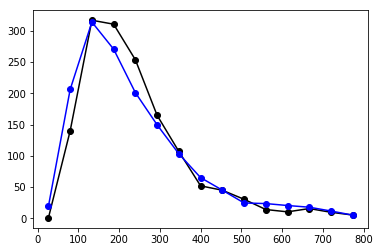

Now unfolding...
Iteration : 0
Chi^2 of change 15.6781
Iteration : 1
Chi^2 of change 5.17657
Iteration : 2
Chi^2 of change 1.89801
Iteration : 3
Chi^2 of change 0.855266
Calculating covariances due to number of measured events
Now unfolding...
Iteration : 0
Chi^2 of change 0.0280824
Iteration : 1
Chi^2 of change 0.0167709
Iteration : 2
Chi^2 of change 0.011833
Iteration : 3
Chi^2 of change 0.00918134
Calculating covariances due to number of measured events


In [18]:
# try unfolding
iterations = 4
kterm = 4
root_Data_Minus_Background_Hist = ROOT.TH1D("Bayes","Bayes",nbins,0,800)
root_Selected_Events_Reco_Hist = ROOT.TH1D("Bayes_mc","Bayes_mc",nbins,0,800)
for i in range(nbins):
    root_Data_Minus_Background_Hist.SetBinContent(i+1,Data_Minus_Background_Hist[i])
    root_Selected_Events_Reco_Hist.SetBinContent(i+1,Selected_Events_Reco_Hist[i])
    
unfold_Bayes_data    = ROOT.RooUnfoldBayes(Response_Matrix, root_Data_Minus_Background_Hist, iterations)
unfold_Bayes_mc      = ROOT.RooUnfoldBayes(Response_Matrix, root_Selected_Events_Reco_Hist, iterations)
# unfold_SVD      = ROOT.RooUnfoldSvd(Response_Matrix, Data_Minus_Background_Hist, kterm)
# unfold_BinByBin = ROOT.RooUnfoldBinByBin(Response_Matrix, Data_Minus_Background_Hist)

# turn back to array
Data_Hist_unf=np.zeros(nbins)
Selected_Events_Reco_unf = np.zeros(nbins)
for i in range(nbins):
    Data_Hist_unf[i]=unfold_Bayes_data.Hreco(2).GetBinContent(i+1)
    Selected_Events_Reco_unf[i]=unfold_Bayes_mc.Hreco(2).GetBinContent(i+1)
    
plt.plot(bincenters,Data_Minus_Background_Hist,color = 'Black', marker = 'o')
plt.plot(bincenters,Data_Hist_unf,color = 'Blue', marker = 'o')

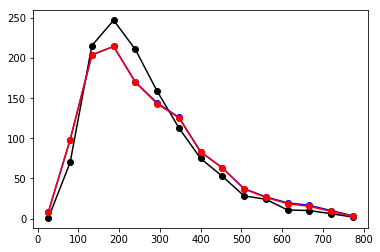

In [19]:
plt.plot(bincenters,Selected_Events_Reco_Hist,color = 'Black', marker = 'o')
plt.plot(bincenters,Selected_Events_Reco_unf,color = 'Blue', marker = 'o')
plt.plot(bincenters,Selected_Events_True_Hist,color = 'Red', marker = 'o')

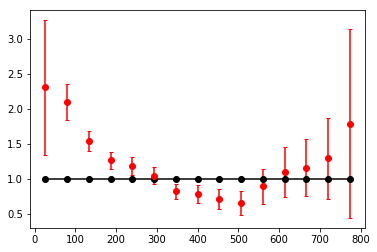

In [20]:
finalratio = np.divide(Data_Hist_unf,Selected_Events_True_Hist)
er_rat = np.sqrt(np.power(np.divide(np.sqrt(Selected_Events_True_Hist),Selected_Events_True_Hist),2) + np.power(np.divide(np.sqrt(Data_Hist_unf),Data_Hist_unf),2)) * np.true_divide(Data_Hist_unf,Selected_Events_True_Hist)
    
# put a line at R=1
testline = np.ones(len(bincenters))
plt.errorbar(bincenters,finalratio,yerr = er_rat,color = 'Red', fmt = 'o',capsize=2)
plt.plot(bincenters,testline,color = 'Black', marker = 'o')

[0.95991817 0.2567764  0.13854723 0.1153324  0.12342747 0.12230518
 0.10915573 0.12972928 0.13889124 0.1723147  0.2528892  0.35250257
 0.40479127 0.57875762 1.346946  ]
363.50900636618695 2.303126725971282
Fitted slope =  -0.0018082903589558303
Fitted intercept =  1.6279600585361764


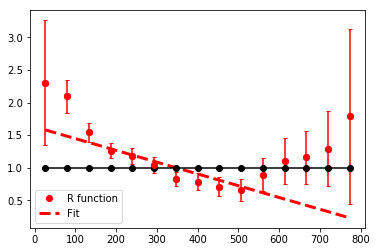

In [21]:
# try to fit a line to it
y = finalratio
x = bincenters
print (er_rat)

# define a function
def bestfitline(x, a, b):
    return a*x+b

#general fit format, any function. You could use 'gaus' as above, or some other function f you can define
#popt,pcov = curve_fit(FUNCTION,x,y,p0 = [the fittable parameters defined in your function. these are just seeds]
#this will work fine unless your seeds are wildly far from the best answer

# trying to only fit to 500 MeV
#set initial parameters for fit
mean = sum(x*y)/sum(y)
first = y[0]
print (mean,first)
p0 = [mean,first]
popt,pcov = curve_fit(bestfitline,x,y,p0=p0,sigma=er_rat,maxfev = 100000000)
#popt is the fitted parameter array, pcov is the covariance array
print ('Fitted slope = ', popt[0])
print ('Fitted intercept = ', popt[1])

plt.plot(x,y,'ro',label='R function')
plt.errorbar(bincenters,finalratio,yerr = er_rat,color = 'Red', fmt = 'o',capsize=2)
plt.plot(x,bestfitline(x,*popt),ls='--',lw=3,color='red',label='Fit')
plt.plot(bincenters,testline,color = 'Black', marker = 'o')
plt.legend(loc='best')
plt.show()

In [22]:
def getweights(df):
    weights_v = []
    for i in range(len(df)):
        truemom = df["pi0_momentum_true"].values[i]
        if truemom<0 or truemom>800:
            newweight = 1.0
        else:
            newweight = truemom*popt[0]+popt[1]
        weights_v.append(newweight)
    return weights_v

def resetweights(df):
    weights_v = []
    for i in range(len(df)):
        weights_v.append(1.0)
    return weights_v


vartest = '_pi0mass'
varname = r'$\pi^0$ mass (MeV)'
myrange = (0,400)
nbins = 20
norm = 1.0

#reset new weights column
ncpi0_cv = resetweights(df_bnb_ncpi0)
df_bnb_ncpi0['new_weight'] = ncpi0_cv
ccpi0_cv = resetweights(df_bnb_ccpi0)
df_bnb_ccpi0['new_weight'] = ccpi0_cv
offvtx_cv = resetweights(df_bnb_pi0_offvtx)
df_bnb_pi0_offvtx['new_weight'] = offvtx_cv

# now add in new weights
# ncpi0_new = getweights(df_bnb_ncpi0)
# df_bnb_ncpi0['new_weight'] = ncpi0_new
# print(df_bnb_ncpi0['new_weight'] .values)
# ccpi0_new = getweights(df_bnb_ccpi0)
# df_bnb_ccpi0['new_weight'] = ccpi0_new
# offvtx_new = getweights(df_bnb_pi0_offvtx)
# df_bnb_pi0_offvtx['new_weight'] = offvtx_new


s_cov = np.genfromtxt('../../systematics/covar_comb_full__pi0_mass_reco.txt',delimiter=',')
d_cov = np.genfromtxt('../../systematics/detvar_pi0mass_cov.txt',delimiter=',')
cov = s_cov+d_cov

run1_open_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_total),(NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUE_SCALE_TOTAL*norm))
run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
run1_open_Hists.AddLayer(df_ext_total,EXT_SCALE_TOTAL*norm,0,'Cosmic Background','fuchsia')
run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 4.2e20 POT [ Run1 + Run3]')
fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)



/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/index

hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.2346969  0.2346969  0.2346969  ... 1.04868423 1.04868423 1.04868423]
Normalization Uncertainty: nan


ZeroDivisionError: float division by zero

In [33]:


def getgleeweights(df):
    weights_v = []
    print(df['nu_interaction_type'].values)
    for i in range(len(df)):
        truemom = df["pi0_momentum_true"].values[i]
        nc= False
        if df["ccnc"].values[i] == 0:
            nc =True
        
        coh = False
        if df['nu_interaction_type'].values[i]==1096 :
            print("COH!")
            coh==True
        
        if truemom<0 or nc ==False:
            weight = 1.0
        elif coh==False:
            weight = (1.1-(float(truemom)*1.1)/1000.0)
        else:
            weight = 2.8
        weights_v.append(weight)
    print("in",len(weights_v),len(df))
    return weights_v


vartest = '_pi0mass'
varname = r'$\pi^0$ mass (MeV)'
myrange = (0,400)
nbins = 20
norm = 1.0

#reset new weights column
ncpi0_cv = resetweights(df_bnb_ncpi0)
df_bnb_ncpi0['new_weight'] = ncpi0_cv
ccpi0_cv = resetweights(df_bnb_ccpi0)
df_bnb_ccpi0['new_weight'] = ccpi0_cv
offvtx_cv = resetweights(df_bnb_pi0_offvtx)
df_bnb_pi0_offvtx['new_weight'] = offvtx_cv

# now add in new weights
ncpi0_new = getgleeweights(df_bnb_ncpi0)
df_bnb_ncpi0['new_weight'] = ncpi0_new
# print(df_bnb_ncpi0['new_weight'] .values)
# ccpi0_new = getgleeweights(df_bnb_ccpi0)
# df_bnb_ccpi0['new_weight'] = ccpi0_new
offvtx_new = getgleeweights(df_bnb_pi0_offvtx)
df_bnb_pi0_offvtx['new_weight'] = offvtx_new


s_cov = np.genfromtxt('../../systematics/covar_comb_full__pi0_mass_reco.txt',delimiter=',')
d_cov = np.genfromtxt('../../systematics/detvar_pi0mass_cov.txt',delimiter=',')
cov = s_cov+d_cov

run1_open_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_total),(NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUMU_SCALE_TOTAL*norm,NUE_SCALE_TOTAL*norm))
run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
run1_open_Hists.AddLayer(df_ext_total,EXT_SCALE_TOTAL*norm,0,'Cosmic Background','fuchsia')
run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 4.2e20 POT [ Run1 + Run3]')
fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)



/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/index

[1009 1000 1006 1006 1000 1006 1006 1092 1009 1092 1006 1092 1007 1008
 1000 1092 1092 1007 1008 1006 1006 1008 1007 1007 1006 1008 1092 1092
 1006 1000 1006 1000 1006 1007 1006 1092 1006 1008 1008 1092 1092 1006
 1007 1009 1092 1007 1000 1006 1000 1006 1008 1006 1000 1008 1009 1007
 1092 1006 1007 1008 1000 1092 1092 1000 1007 1092 1007 1006 1008 1092
 1092 1006 1000 1008 1008 1006 1007 1008 1006 1006 1092 1092 1000 1008
 1008 1006 1006 1008 1092 1092 1008 1006 1007 1006 1009 1006 1008 1006
 1000 1092 1006 1000 1002 1007 1006 1092 1008 1009 1000 1092 1006 1006
 1009 1006 1006 1007 1092 1008 1000 1008 1092 1007 1006 1092 1092 1006
 1092 1000 1000 1009 1007 1009 1008 1092 1092 1092 1002 1001 1000 1000
 1001 1001 1006 1001 1007 1005 1006 1002 1092 1008 1001 1002 1000 1001
 1092 1006 1000 1009 1009 1001 1006 1008 1009 1001 1007 1001 1006 1002
 1008 1091 1006 1002 1006 1008 1007 1007 1007 1007 1001 1006 1008 1001
 1003 1008 1008 1006 1008 1001 1000 1092 1002 1092 1007 1009 1000 1008
 1001 

ZeroDivisionError: float division by zero

In [29]:
vartest = 'pi0energy'
varname = r'$\pi^0$ energy (MeV)'
myrange = (100,700)
nbins = 15

var_bnb_ncpi0 = recopi0energy(df_bnb_ncpi0)
var_bnb_ccpi0 = recopi0energy(df_bnb_ccpi0)
var_bnb_pi0_offvtx = recopi0energy(df_bnb_pi0_offvtx)
var_bnb_other_offvtx = recopi0energy(df_bnb_other_offvtx)
var_bnb_other_good = recopi0energy(df_bnb_other_good)

# var_bnb_dis = recopi0energy(df_bnb_dis)
# var_bnb_respi0 = recopi0energy(df_bnb_respi0)
# var_bnb_other = recopi0energy(df_bnb_other)
# var_bnb_offvtx = recopi0energy(df_bnb_offvtx)
var_nue = recopi0energy(df_nue_pi0)
var_ext = recopi0energy(df_ext_pi0)
var_data = recopi0energy(df_data_pi0)

#First reset the original weights
weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE
a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]


fig,ax = plt.subplots(figsize=(14,10))
ax0,chi = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx, var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,50)


NameError: name 'df_data_pi0' is not defined

7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.9631140815176 0.0012813054951646974


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in true_divide


Events: 136.0
MC:  182.35746173741796
15 5.477225575051661


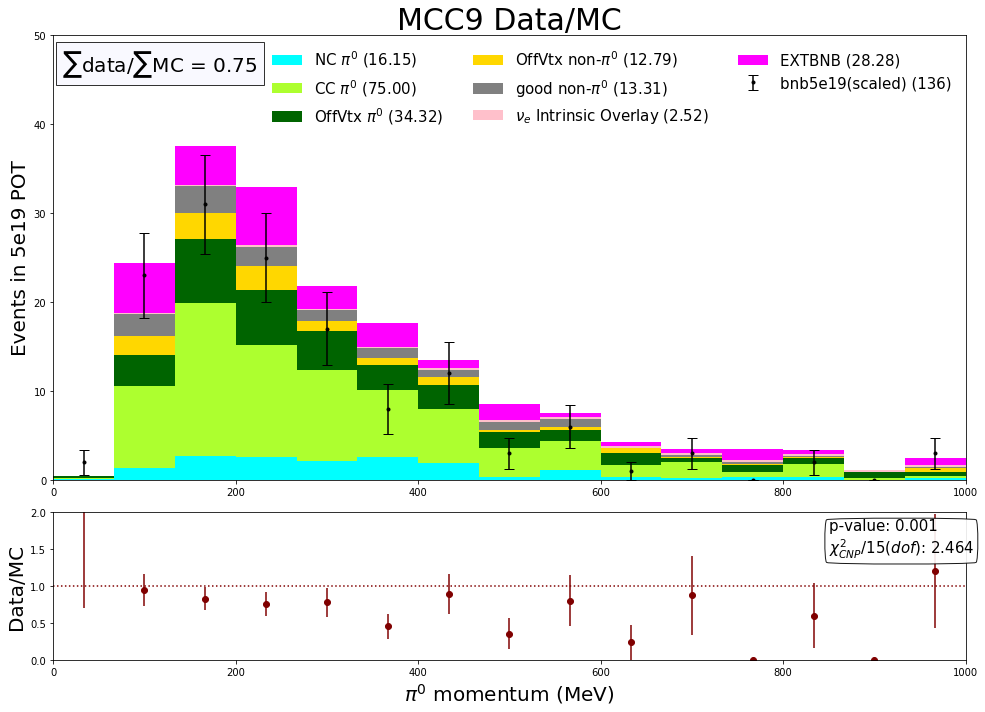

In [9]:
vartest = 'pi0 momentum'
varname = r'$\pi^0$ momentum (MeV)'
myrange = (0,1000)
nbins = 15

var_bnb_ncpi0 = recomomentum(df_bnb_ncpi0)
var_bnb_ccpi0 = recomomentum(df_bnb_ccpi0)
var_bnb_pi0_offvtx = recomomentum(df_bnb_pi0_offvtx)
var_bnb_other_offvtx = recomomentum(df_bnb_other_offvtx)
var_bnb_other_good = recomomentum(df_bnb_other_good)

var_nue = recomomentum(df_nue_pi0)
var_ext = recomomentum(df_ext_pi0)
var_data = recomomentum(df_data_pi0)

#First reset the original weights
weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE
a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]


fig,ax = plt.subplots(figsize=(14,10))
ax0,chi = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx, var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,50)


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in true_divide


7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 28.624689970931545 0.01797020630229129
Events: 136.0
MC:  166.77910190425445
15 5.477225575051661


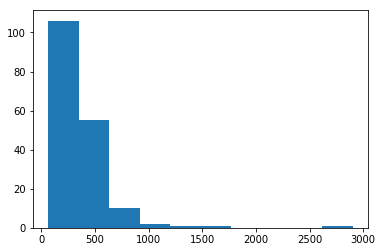

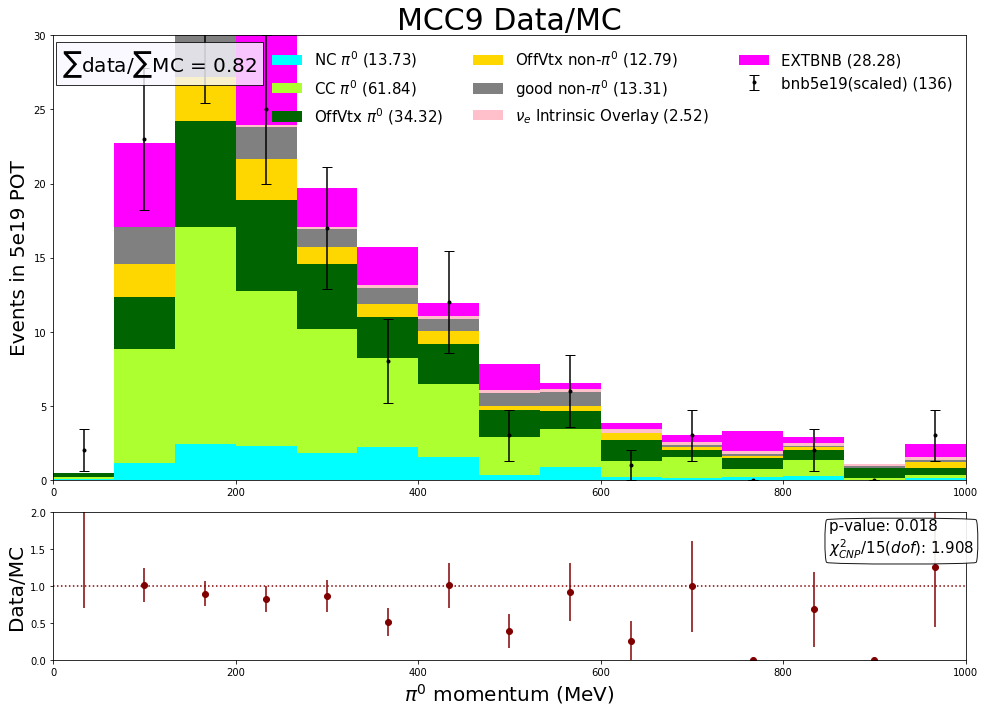

In [35]:
# try pandora weights
# E<600 : 1-0.4*E/1000.0, E>600: 1-.4*.6

#First reset the original weights
weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE

def performweights_pelee(var,weight,w =.4):
    newweight=[]
    for idx in range(len(var)):
#         singleweight = 1-w*var[idx]/1000.0
#         print(singleweight)
        if (var[idx] <400):
            singleweight = 1-w*var[idx]/1000.0
        else:
            singleweight = 1-(w*.6)
        newweight.append(weight[idx]*singleweight)
    return newweight

var_bnb_ncpi0_true = truemomentum(df_bnb_ncpi0)
plt.hist(var_bnb_ncpi0)
var_bnb_ccpi0_true = truemomentum(df_bnb_ccpi0)
weights_bnb_ncpi0 =performweights_pelee(var_bnb_ncpi0_true,weights_bnb_ncpi0)

weights_bnb_ccpi0 = performweights_pelee(var_bnb_ccpi0_true,weights_bnb_ccpi0)

a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]


fig,ax = plt.subplots(figsize=(14,10))
ax0,chisq = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx,var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,30)

7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.9631140815176 0.0012813054951646974


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in true_divide


Events: 136.0
MC:  182.35746173741796
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.7232553028301 0.0013887359726053594
Events: 136.0
MC:  181.96800274158872
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.484940501769806 0.0015040439407496553
Events: 136.0
MC:  181.57854374575965
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.24817442082324 0.001627703598966912
Events: 136.0
MC:  181.18908474993046
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 36.01296184974289 0.00176020891175932
Events: 136.0
MC:  180.79962575410147
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 35.77930762616435 0.0019020737256881803
Events: 136.0
MC:  180.4101667582724
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 35.54721663623426 0.002053831823456864
Events: 1

stats: 26.966876879950277 0.02900738661683211
Events: 136.0
MC:  162.88451194596357
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.81112018055017 0.030313489912473846
Events: 136.0
MC:  162.49505295013455
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.657217413839653 0.03165655015310309
Events: 136.0
MC:  162.1055939543054
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.50517669712779 0.03303638292322719
Events: 136.0
MC:  161.7161349584763
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.3550062434625 0.034452728223024476
Events: 136.0
MC:  161.32667596264716
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.206714363121414 0.035905248494580766
Events: 136.0
MC:  160.93721696681814
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 26.060

Events: 136.0
MC:  143.41156215450917
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.584136382546863 0.11918096914483167
Events: 136.0
MC:  143.02210315868012
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.535729387574055 0.12056797920081397
Events: 136.0
MC:  142.63264416285108
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.489752719078172 0.12189773130659465
Events: 136.0
MC:  142.243185167022
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.446222112464305 0.12316791698411633
Events: 136.0
MC:  141.85372617119293
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.40515353285285 0.12437628626941666
Events: 136.0
MC:  141.46426717536377
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 21.366563179538403 0.12552065227827747
Events: 136.0

stats: 22.51382072270909 0.09502208786263067
Events: 136.0
MC:  123.54915336722591
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 22.61203033305401 0.09273177424198054
Events: 136.0
MC:  123.15969437139678
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 22.71385996905868 0.09040698914374568
Events: 136.0
MC:  122.77023537556772
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 22.819345510302533 0.08805153087133588
Events: 136.0
MC:  122.38077637973865
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 22.92852352393347 0.08566927347352782
Events: 136.0
MC:  121.9913173839095
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 23.041431282286826 0.0832641567898017
Events: 136.0
MC:  121.60185838808046
15 5.477225575051661
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 23.158106

Text(0, 0.5, 'chi2 value (statistical)')

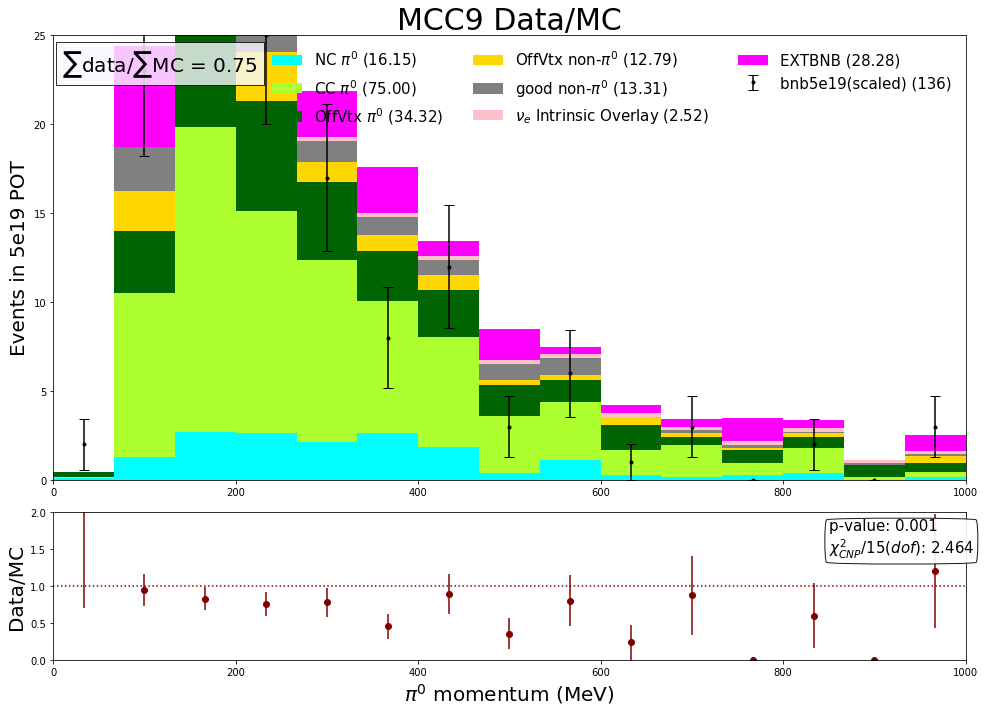

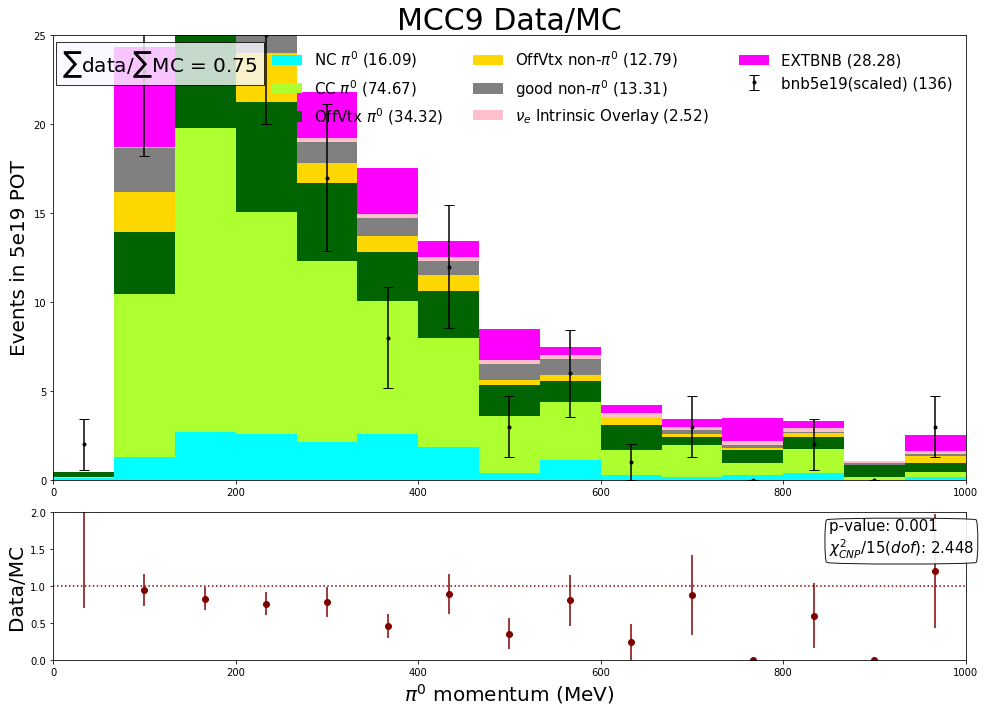

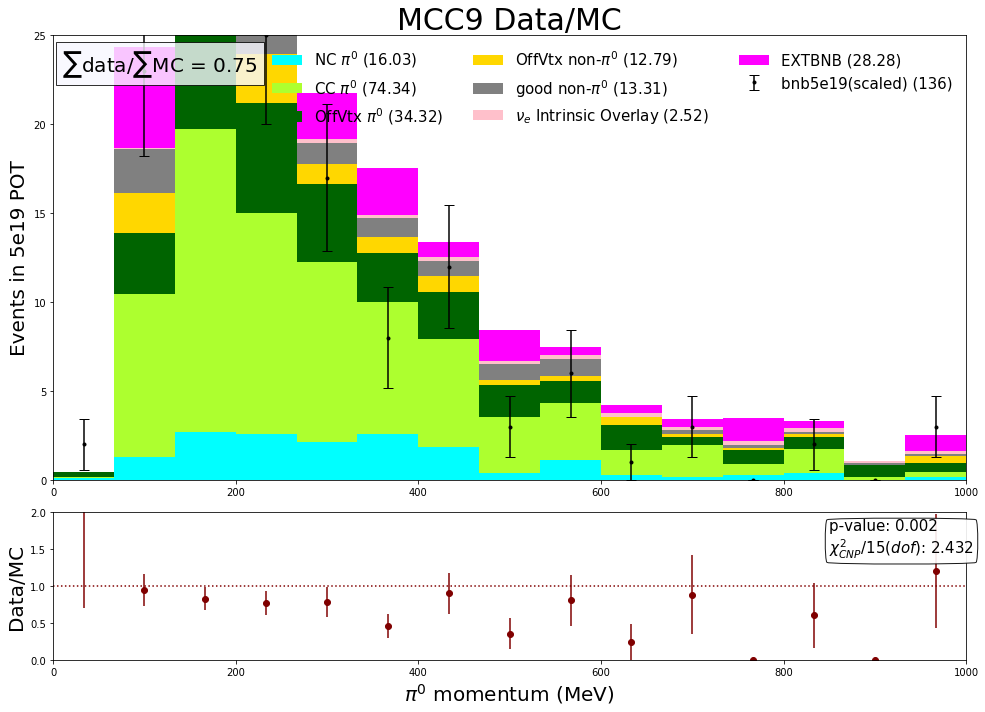

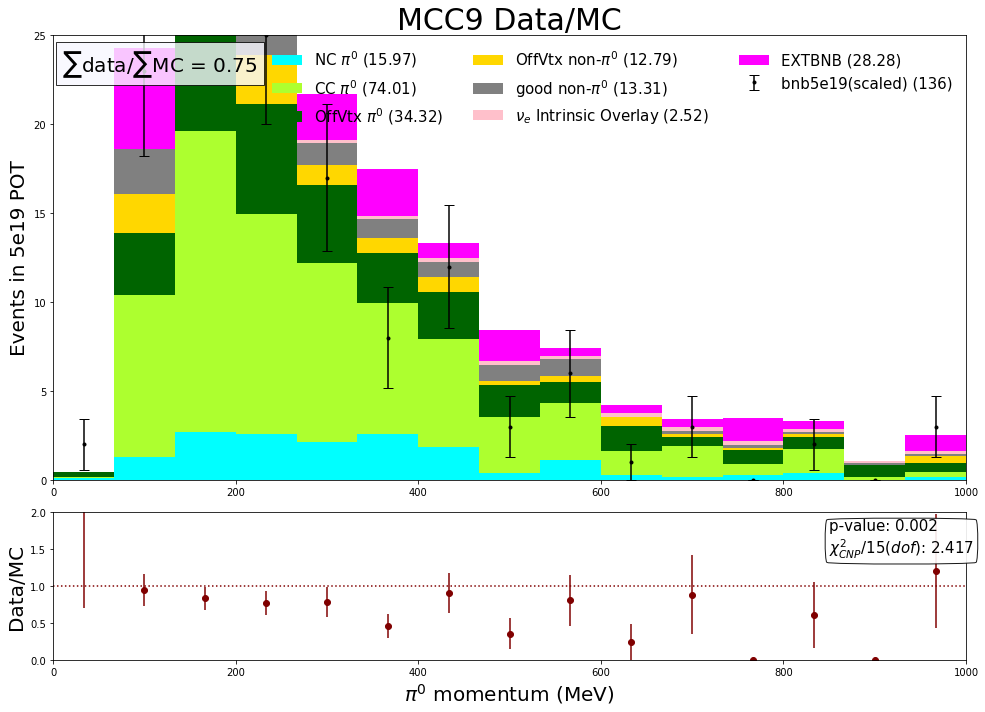

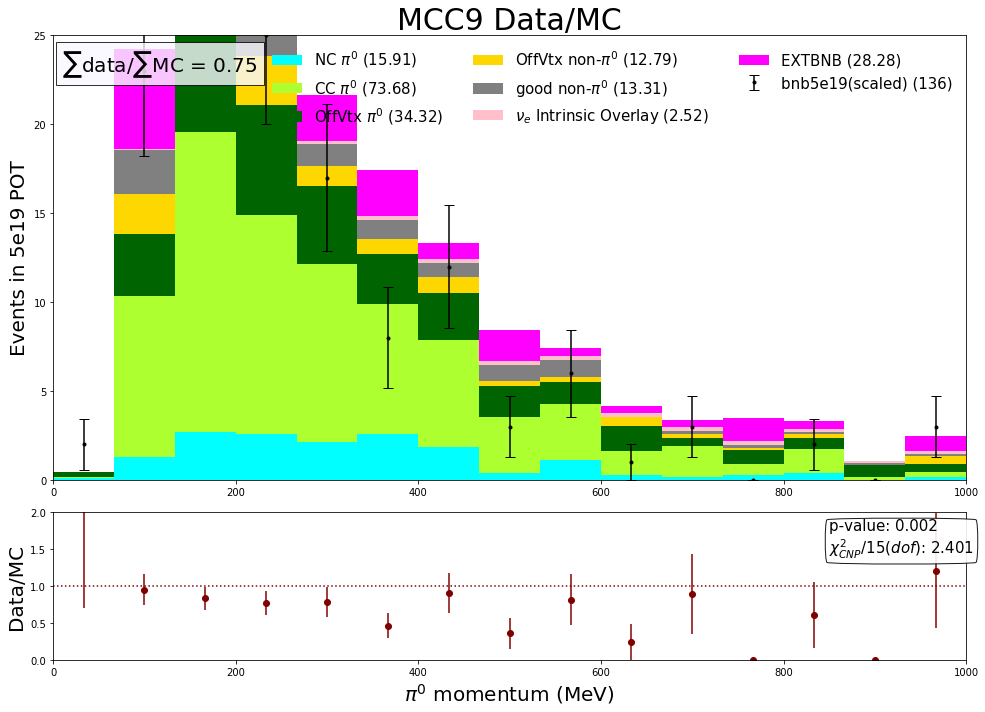

...

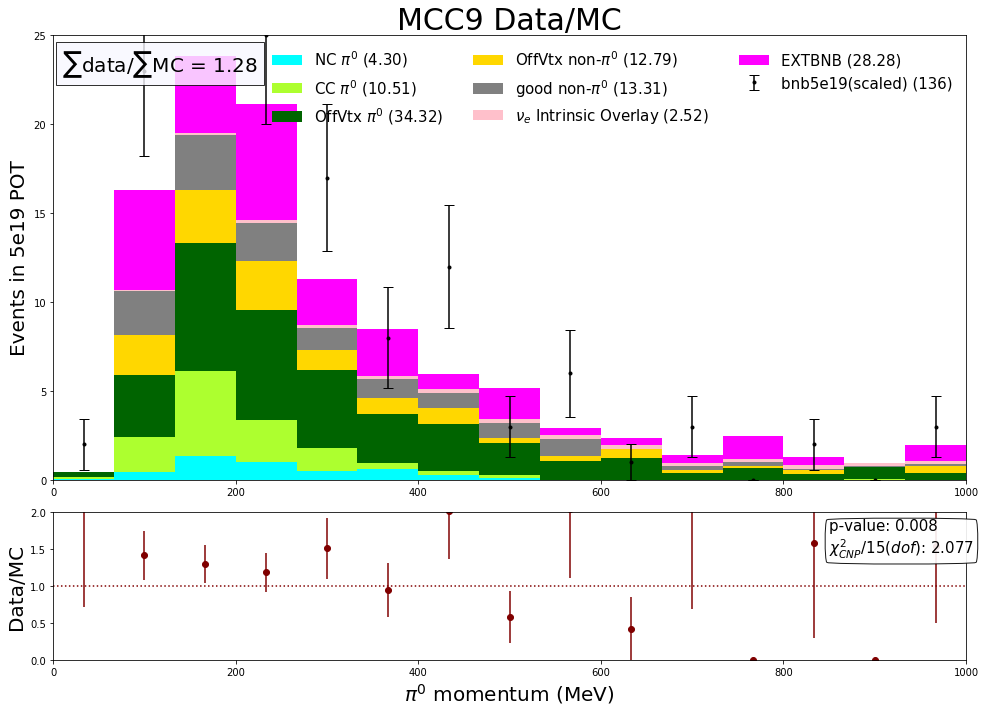

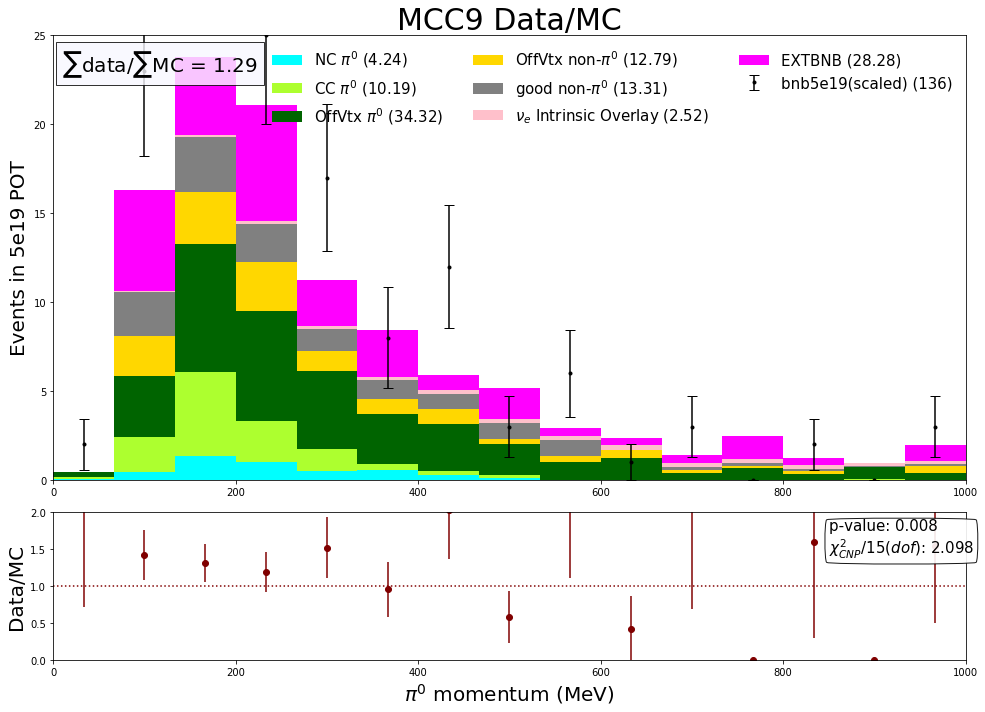

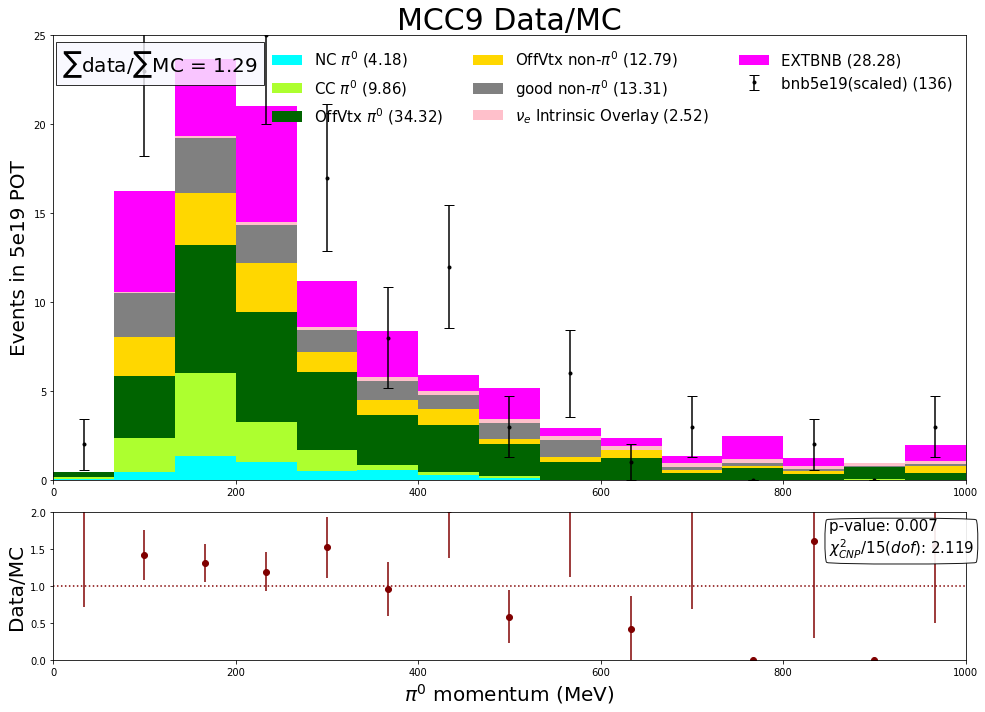

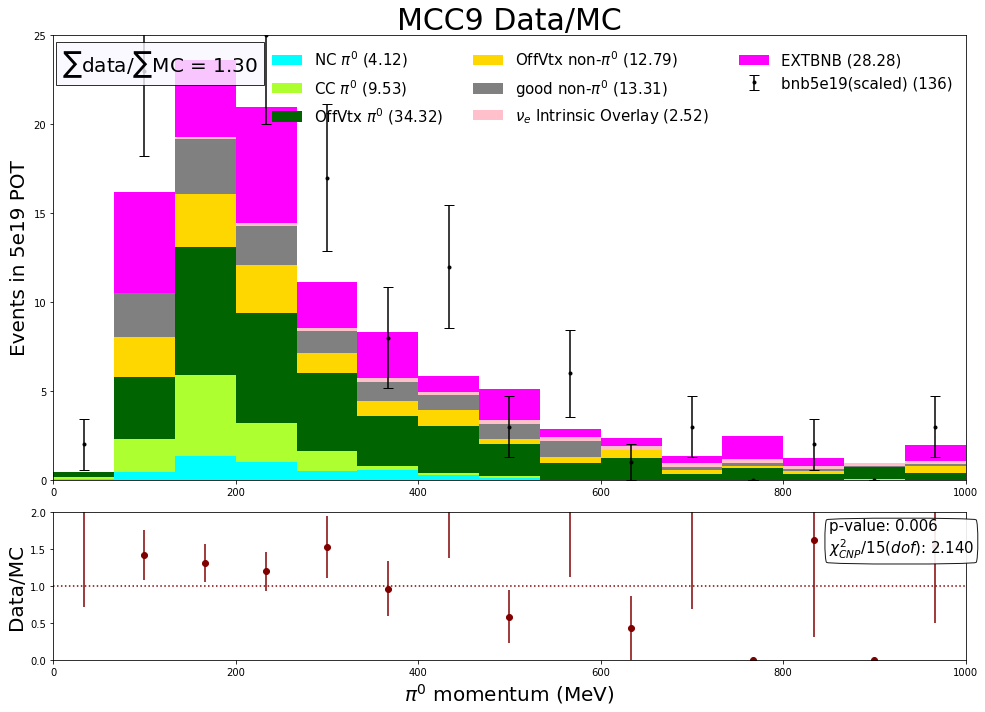

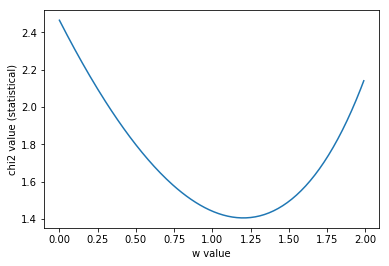

In [36]:
#try to figure out which factor is best for ours
weights=[.01*i for i in range(200)]
minchi=1000000
bestweight =0
chi =[]
for w in weights:
    weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
    weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
    weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
    weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
    weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
    weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
    weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE


    weights_bnb_ncpi0 =performweights_pelee(var_bnb_ncpi0_true,weights_bnb_ncpi0,w)
    weights_bnb_ccpi0 = performweights_pelee(var_bnb_ccpi0_true,weights_bnb_ccpi0,w)
    a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]


    fig,ax = plt.subplots(figsize=(14,10))
    ax0,chisq = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx,var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,25)
    chi.append(chisq)
    plt.close
    if (chisq<minchi):
        minchi = chisq
        bestweight = w
        
print("best w: ", bestweight, " minchi: ",minchi)
fig, ax = plt.subplots()
plt.plot(weights,chi)
ax.set_xlabel("w value")
ax.set_ylabel("chi2 value (statistical)")


7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 37.663860897937724 0.0010114000329447537


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in true_divide


Events: 136.0
MC:  112.784170049818
15 5.477225575051661


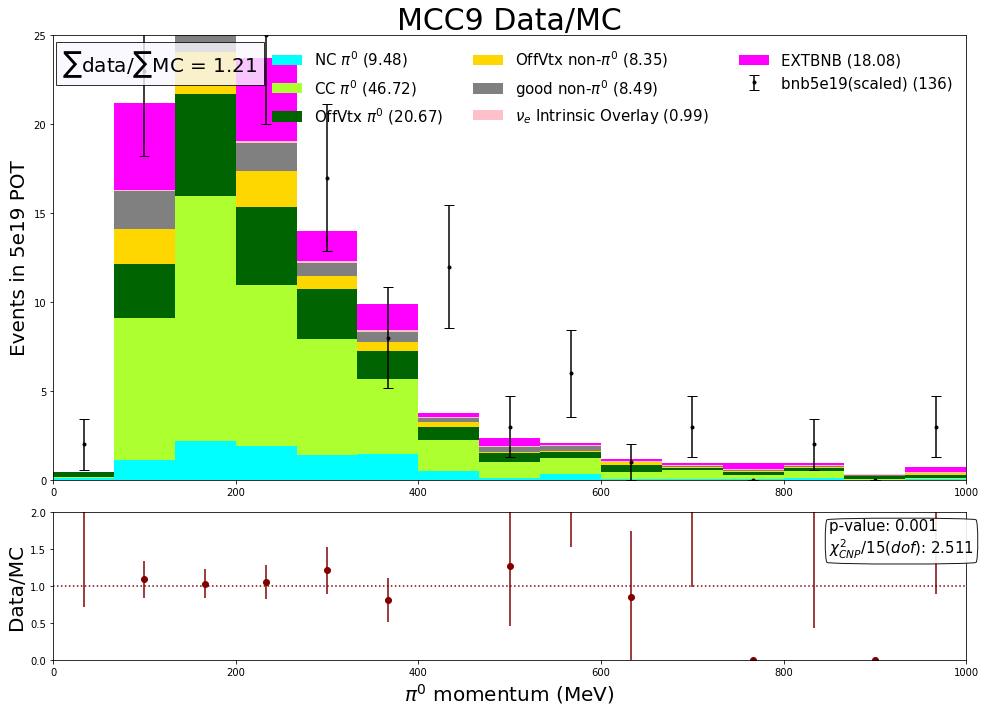

In [37]:
w = bestweight

weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE


weights_bnb_ncpi0 =performweights_pelee(var_bnb_ncpi0,weights_bnb_ncpi0,w)
weights_bnb_ccpi0 = performweights_pelee(var_bnb_ccpi0,weights_bnb_ccpi0,w)
weights_bnb_pi0_offvtx  = performweights_pelee(var_bnb_pi0_offvtx,weights_bnb_pi0_offvtx,w)
weights_bnb_other_offvtx  = performweights_pelee(var_bnb_other_offvtx,weights_bnb_other_offvtx,w)
weights_bnb_other_good = performweights_pelee(var_bnb_other_good,weights_bnb_other_good,w)
weights_nue_pi0 = performweights_pelee(var_nue,weights_nue_pi0,w)
weights_ext_pi0 = performweights_pelee(var_ext,weights_ext_pi0,w)
a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]


fig,ax = plt.subplots(figsize=(14,10))
ax0,chisq = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx,var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,25)



([array([ 0.,  0.,  0., 71., 14., 13.,  5.,  7.,  9.,  5.]),
  array([  0.,   0.,   0., 572.,  76.,  55.,  20.,  25.,  27.,  15.])],
 array([100., 160., 220., 280., 340., 400., 460., 520., 580., 640., 700.]),
 <a list of 2 Lists of Patches objects>)

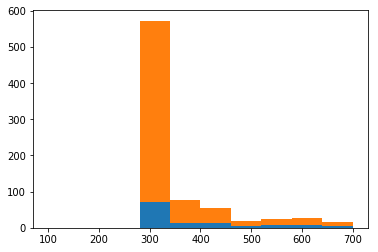

In [37]:
plt.hist([var_bnb_ncpi0_true,var_bnb_ccpi0_true],stacked =True,range=[100,700])

7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 20.91615397934436 0.3414522810657763


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:153: RuntimeWarning: invalid value encountered in true_divide


Events: 134.0
MC:  133.7875425018809
19 6.164414002968976
7 7
176 176
817 817
381 381
128 128
137 137
8064 8064
74 74
stats: 33.168604488095596 0.0229854858477051
Events: 134.0
MC:  176.00032079852298
19 6.164414002968976


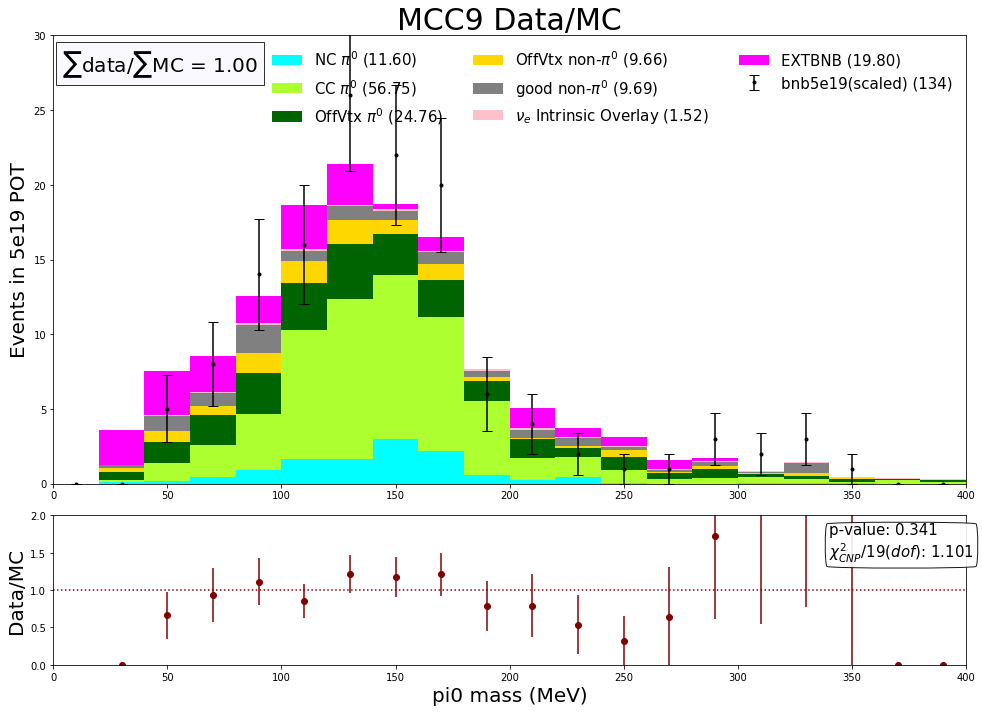

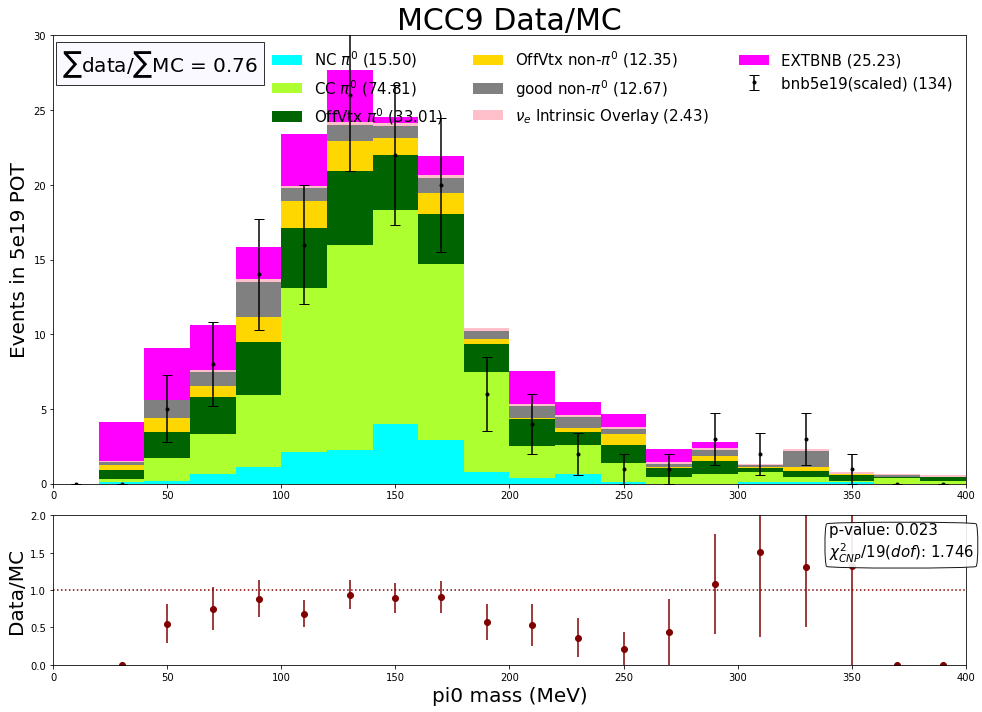

In [13]:
vartest = '_pi0mass'
varname = r'pi0 mass (MeV)'
myrange = (0,400)
nbins = 20

var_bnb_ncpi0 = df_bnb_ncpi0[vartest].values
var_bnb_ccpi0 = df_bnb_ccpi0[vartest].values
var_bnb_pi0_offvtx = df_bnb_pi0_offvtx[vartest].values
var_bnb_other_offvtx = df_bnb_other_offvtx[vartest].values
var_bnb_other_good = df_bnb_other_good[vartest].values
var_nue = df_nue_pi0[vartest].values
var_ext = df_ext_pi0[vartest].values
var_data = df_data_pi0[vartest].values

fig,ax = plt.subplots(figsize=(14,10))
ax0,chisq = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx,var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,30)

weights_bnb_ncpi0 = SF.CV(df_bnb_ncpi0)*NUMU_SCALE
weights_bnb_ccpi0 = SF.CV(df_bnb_ccpi0)*NUMU_SCALE
weights_bnb_pi0_offvtx = SF.CV(df_bnb_pi0_offvtx)*NUMU_SCALE 
weights_bnb_other_offvtx = SF.CV(df_bnb_other_offvtx)*NUMU_SCALE
weights_bnb_other_good = SF.CV(df_bnb_other_good)*NUMU_SCALE
weights_nue_pi0 = SF.CV(df_nue_pi0)*NUE_SCALE
weights_ext_pi0 = np.ones(len(df_ext_pi0))*EXT_SCALE
a_weights = [weights_bnb_ncpi0,weights_bnb_ccpi0,weights_bnb_pi0_offvtx,weights_bnb_other_offvtx,weights_bnb_other_good,weights_nue_pi0,weights_ext_pi0]

fig,ax = plt.subplots(figsize=(14,10))
ax0,chisq = distplot_wratio(nbins,myrange,[var_bnb_ncpi0,var_bnb_ccpi0,var_bnb_pi0_offvtx,var_bnb_other_offvtx,var_bnb_other_good,var_nue,var_ext],var_data,weights_data_pi0,varname,30)
